# Practical Exam Project 

**Neural Network and Deep Learning** 

Dataset chosen : 
https://www.kaggle.com/datasets/umairshahpirzada/birds-20-species-image-classification/data

<span style="color:red">Natalia GERARD and Alexis Denneulin</span>

**Project Requirements**  
The project should be concise: only one HTML file should be submitted.  
You must implement one (or at most two) models from the following categories:  
- Deep CNN
- Generative AI
- LLM (Large Language Models)
- Transformers
You are free to choose the dataset for your project.

**Submission Process**
Submission spaces will be created for each group.  
Ensure your project is submitted on time. Late submissions will not be accepted.  
Grading Criteria (20 points total)  
5 points: Originality of the approach and model compared to what was covered in the practical sessions.  
5 points: In-depth analysis of the results.  
5 points: Originality of the dataset and quality of its description.  
5 points: Code quality, readability, comments, and overall presentation.  
Good luck!

<span style="color:blue">Implementation of a deep CNN for a Bird dataset </span>

Importing libraries 

In [128]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split

In [129]:
from tensorflow import keras
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import Model


In [130]:
from pathlib import Path
import os.path
import random

In [131]:
!pip install opencv-python

In [132]:
# for visualisation
import matplotlib.cm as cm
import cv2
import seaborn as sns 

In [133]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

Dataset Loading and Preprocessing

In [134]:
TARGET_SIZE = (224, 224)
BATCH_SIZE = 32

We chose a `target_size` of (224, 224) because all the images in the dataset chosen are already 224x224 pixels. This allows us to use them directly without resizing.

We use a `batch_size` of 32, which is a common choice for image classification tasks. The batch size refers to the number of images the model processes before updating its weights. A batch size of 32 provides a good balance between training speed and memory efficiency, especially given the moderate size of our dataset (3208 training images).

<span style="color:blue">Exploratory Data Analysis (EDA)</span>

Loading the dataset 

In [135]:
DATASET_PATH = "/kaggle/input/archive-birds"

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen  = ImageDataGenerator(rescale=1./255)

# Load datasets
train_generator = train_datagen.flow_from_directory(
    directory=os.path.join(DATASET_PATH, 'train'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

valid_generator = valid_datagen.flow_from_directory(
    directory=os.path.join(DATASET_PATH, 'valid'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    directory=os.path.join(DATASET_PATH, 'test'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False  
)

Found 3208 images belonging to 20 classes.
Found 100 images belonging to 20 classes.
Found 100 images belonging to 20 classes.


Placing Training Data into a DataFrame

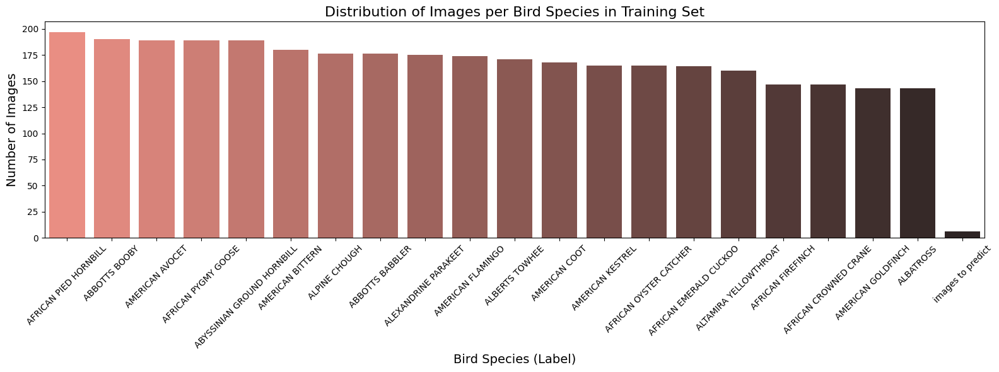

In [136]:
image_dir = Path("/kaggle/input/archive-birds")

# Get all image paths in the train folder (recursive search)
filepaths = list(image_dir.glob('**/*.jpg')) + list(image_dir.glob('**/*.JPG')) + list(image_dir.glob('**/*.png'))

# Extract labels from the parent directory name of each image
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

# Create a DataFrame containing image paths and labels
filepaths_series = pd.Series(filepaths, name='Filepath').astype(str)
labels_series = pd.Series(labels, name='Label')
image_df = pd.concat([filepaths_series, labels_series], axis=1)

# Count the number of images per label (bird species)
label_counts = image_df['Label'].value_counts()

# Plot the distribution of images per bird species
plt.figure(figsize=(16, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette='dark:salmon_r')
plt.title('Distribution of Images per Bird Species in Training Set', fontsize=16)
plt.xlabel('Bird Species (Label)', fontsize=14)
plt.ylabel('Number of Images', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

We plot the distribution of images across bird species to verify how balanced the dataset is. A balanced dataset is important for training a well-performing model.Here it is pretty well balanced. 

Visualizing Sample Images from the Dataset

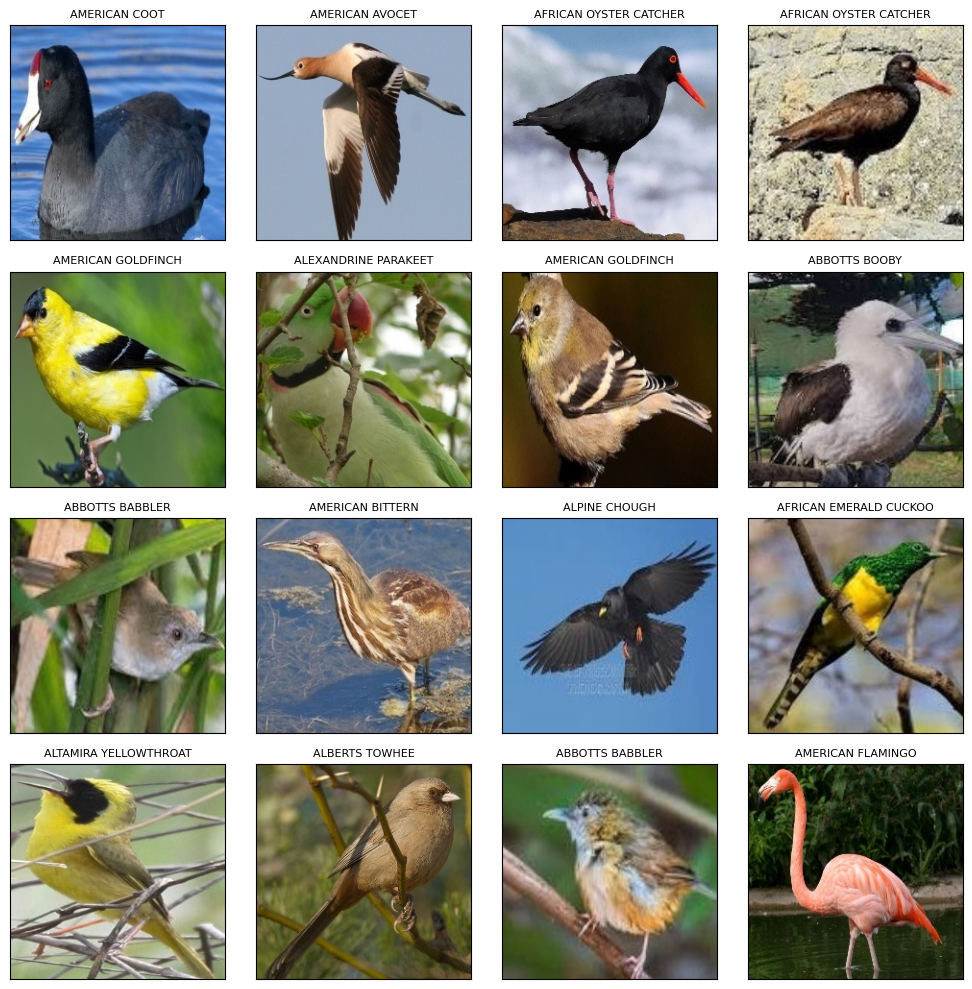

In [137]:
import numpy as np
import matplotlib.pyplot as plt

# Randomly select 16 image indices from the DataFrame
random_index = np.random.randint(0, len(image_df), 16)

# Create a 4x4 grid of subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                         subplot_kw={'xticks': [], 'yticks': []})

# Plot each image with its corresponding label as title
for i, ax in enumerate(axes.flat):
    img = plt.imread(image_df.Filepath[random_index[i]])
    ax.imshow(img)
    ax.set_title(image_df.Label[random_index[i]], fontsize=8)

plt.tight_layout()
plt.show()

Error Level Analysis (ELA)

We use Error Level Analysis (ELA) to visualize the differences between a bird image and its compressed versions. 
ELA highlights the areas of the image most affected by JPEG compression. This helps us understand how image degradation may influence model performance

- The **first image** (top-left) is the original image with 100% quality (no compression).
- The **next images** show the error maps generated by compressing the image at decreasing quality levels (from 92 to 36).
- As the quality decreases, compression artifacts become more visible — especially around the bird’s wings and edges.


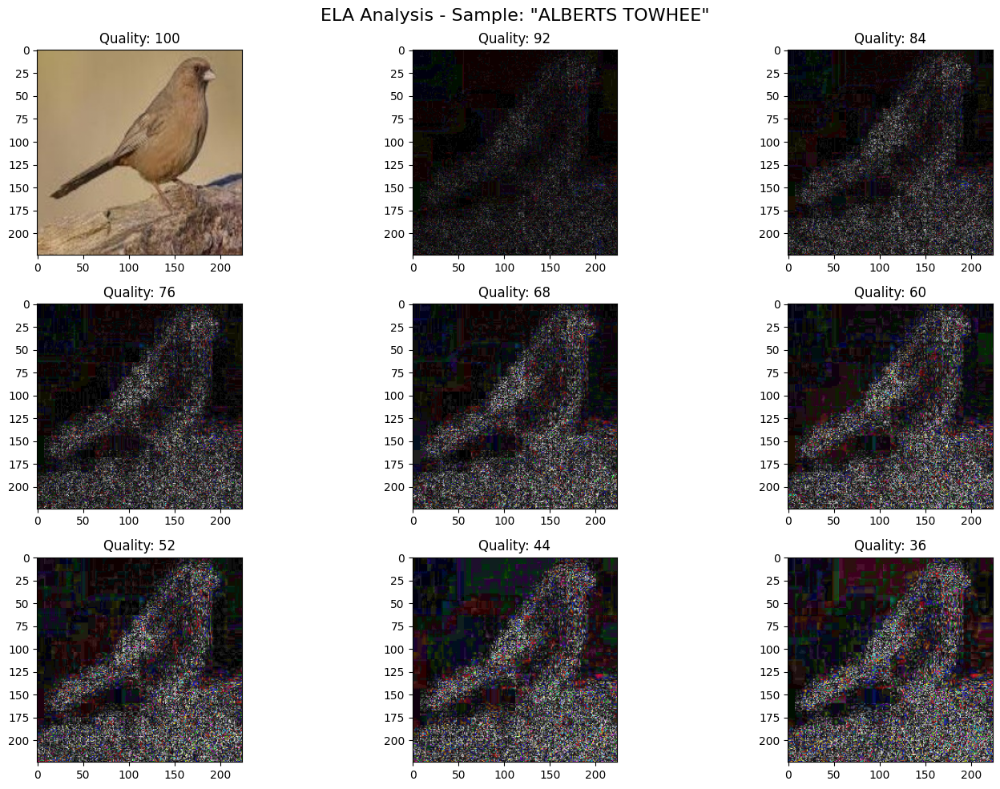

In [138]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_ela_image.jpeg'
    SCALE = 15

    # Load the original image
    orig_img = cv2.imread(path)
    if orig_img is None:
        raise ValueError(f"Could not read image: {path}")
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    # Compress the image using JPEG at specified quality
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])
    
    # Read the compressed image and compute the absolute difference
    compressed_img = cv2.imread(temp_filename)
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    
    return diff

def random_sample(path):
    extensions = ['JPG', 'jpg', 'jpeg', 'png']
    items = []
    # Search recursively in all subfolders
    for ext in extensions:
        items.extend(Path(path).rglob(f'*.{ext}'))
        
    if not items:
        raise ValueError(f"No image files found in folder or subfolders: {path}")
        
    return random.choice(items).as_posix()

# Path to the dataset
species_dir = Path("/kaggle/input/archive-birds")

# Find all image files in the dataset
try:
    random_img_path = random_sample(species_dir)

    # Load original image (for display)
    orig = cv2.imread(random_img_path)
    if orig is None:
        raise ValueError(f"Could not read selected image: {random_img_path}")
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0

    # Generate ELA images at different compression levels
    init_val = 100
    columns, rows = 3, 3

    fig = plt.figure(figsize=(15, 10))
    for i in range(1, columns * rows + 1):
        quality = init_val - (i - 1) * 8
        if i == 1:
            img = orig.copy()
        else:
            img = compute_ela_cv(path=random_img_path, quality=quality)

        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text(f'Quality: {quality}')
        plt.imshow(img)

    species_name = Path(random_img_path).parent.name
    plt.suptitle(f'ELA Analysis - Sample: "{species_name}"', fontsize=16)
    plt.tight_layout()
    plt.show()

except ValueError as e:
    print(f"Error: {e}")
    print("Please check the dataset structure and ensure it contains image files.")

<span style="color:blue">Data Preprocessing</span>

I use a dataset already separated into 3 folders (train, validation, test)

In [139]:
# Création du modèle CNN
model = tf.keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(train_generator.class_indices), activation='softmax')  # Nombre de classes
])

# Compilation du modèle
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=10,  
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2)
    ]
)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


101/101 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.0668 - loss: 3.1539 - val_accuracy: 0.2900 - val_loss: 2.4415 - learning_rate: 0.0010
Epoch 2/10
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - accuracy: 0.2487 - loss: 2.4468 - val_accuracy: 0.4900 - val_loss: 1.6702 - learning_rate: 0.0010
Epoch 3/10
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - accuracy: 0.4334 - loss: 1.8249 - val_accuracy: 0.6100 - val_loss: 1.3674 - learning_rate: 0.0010
Epoch 4/10
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - accuracy: 0.5502 - loss: 1.4261 - val_accuracy: 0.6800 - val_loss: 1.1570 - learning_rate: 0.0010
Epoch 5/10
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - accuracy: 0.6543 - loss: 1.1102 - val_accuracy: 0.7300 - val_loss: 0.9395 - learning_rate: 0.0010
Epoch 6/10
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - accuracy: 0.7148 - loss: 0.9098 - val_accuracy: 0.7500 - val_loss: 0.9774 - learning_rate: 0.0010
Epoch 7/10
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - accuracy: 0.7544 - loss: 0.7320 - val

In [140]:
results = model.evaluate(test_generator, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.91101
Test Accuracy: 75.00%


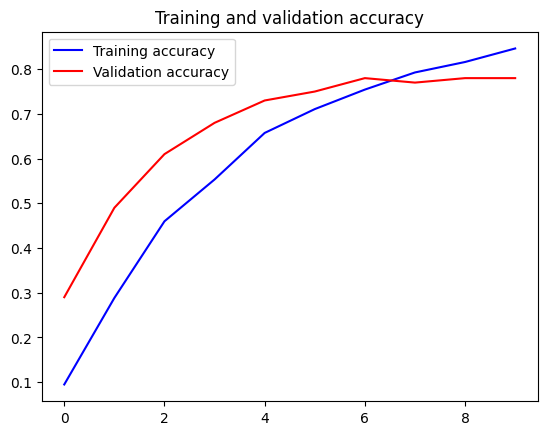

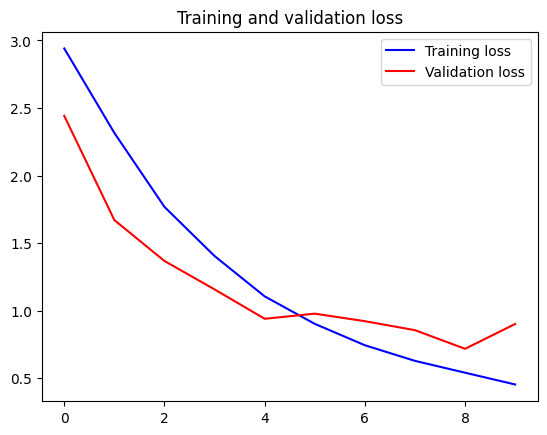

In [141]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()




We initially tested a standard Deep CNN architecture on our dataset using basic image normalization (`rescale=1./255`). This gave us our performance baseline.


To leverage modern architecture and pre-trained weights, we now implement an EfficientNetB0-based solution. This requires specific data preprocessing:

### Data Pipeline Adaptation
EfficientNet requires different preprocessing than our baseline CNN. We must:
1. Use EfficientNet's specific `preprocess_input` function
2. Maintain proper train/val/test splits
3. Ensure consistent preprocessing across all sets

In [142]:
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input

In [143]:

train_datagen = ImageDataGenerator()
valid_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

# Datasets
train_images = train_datagen.flow_from_directory(
    directory=os.path.join(DATASET_PATH, 'train'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_images = valid_datagen.flow_from_directory(
    directory=os.path.join(DATASET_PATH, 'valid'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

test_images = test_datagen.flow_from_directory(
    directory=os.path.join(DATASET_PATH, 'test'),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 3208 images belonging to 20 classes.
Found 100 images belonging to 20 classes.
Found 100 images belonging to 20 classes.


In [144]:
# Load the pretained model
pretrained_model = tf.keras.applications.efficientnet.EfficientNetB0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

pretrained_model.trainable = False

In this function we are trying to generate as much pictures and modification as we can to make the model more robust even with noise

In [145]:

augment = tf.keras.Sequential([
    layers.Resizing(224, 224),
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(factor=0.2),  # Augmenté à ±20%
    layers.RandomZoom(height_factor=0.3, width_factor=0.3),  # Zoom plus aggressif
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.2),
    layers.GaussianNoise(0.08), # bruit synthétique
    layers.Lambda(preprocess_input),
    layers.RandomCrop(height=180, width=180),  # Recadrage aléatoire
    layers.Resizing(224, 224)  # Final resize après crop
], name="Advanced_Augmentation")

In [146]:
inputs = layers.Input(shape=(224, 224, 3))
x = augment(inputs)
x = pretrained_model(x, training=False)  
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.45)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.45)(x)
outputs = layers.Dense(20, activation='softmax')(x)

model_EN = Model(inputs=inputs, outputs=outputs)



In [147]:
# Compile & Train
model_EN.compile(
    optimizer=Adam(0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, min_lr=1e-6)

history = model_EN.fit(
    train_images,
    validation_data=val_images,
    epochs=150,
    callbacks=[early_stopping, reduce_lr],
    validation_freq=1
)

Epoch 1/150


E0000 00:00:1744321066.898421      31 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_15_1/efficientnetb0_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


101/101 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - accuracy: 0.0599 - loss: 6.0356 - val_accuracy: 0.1800 - val_loss: 2.8691 - learning_rate: 1.0000e-04
Epoch 2/150
101/101 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - accuracy: 0.0670 - loss: 3.0307 - val_accuracy: 0.1700 - val_loss: 2.7761 - learning_rate: 1.0000e-04
Epoch 3/150
101/101 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.0829 - loss: 2.9799 - val_accuracy: 0.2300 - val_loss: 2.6715 - learning_rate: 1.0000e-04
Epoch 4/150
101/101 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.1029 - loss: 2.9138 - val_accuracy: 0.3200 - val_loss: 2.5314 - learning_rate: 1.0000e-04
Epoch 5/150
101/101 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - accuracy: 0.1293 - loss: 2.8441 - val_accuracy: 0.3000 - val_loss: 2.3771 - learning_rate: 1.0000e-04
Epoch 6/150
101/101 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.1622 - loss: 2.7759 - val_accuracy: 0.4100 - val_loss: 2.1507 - learning_rate: 1.0000e-04
Epoch 7/150
101/101 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - accura

In [148]:
results = model_EN.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.07117
Test Accuracy: 98.00%


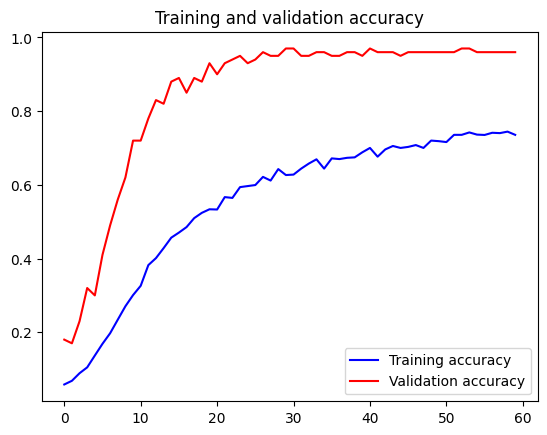

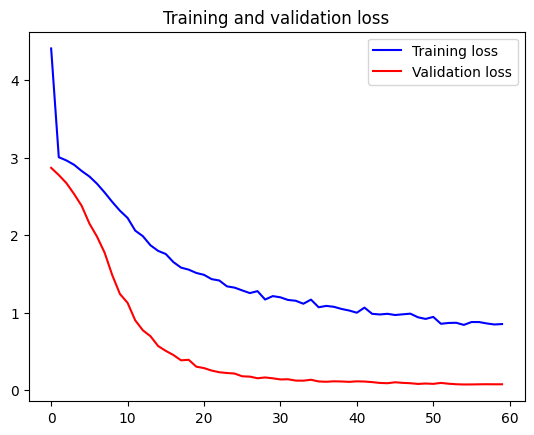

In [149]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()

In [155]:
import numpy as np

# Créez un batch de test bruité
x_test_noisy = test_images[0][0] + np.random.normal(0, 0.1, test_images[0][0].shape)

# Évaluation
noisy_acc = model_EN.evaluate(x_test_noisy, test_images[0][1], verbose=0)[1]
print(f"Accuracy sur données bruitées: {noisy_acc:.2%}")  

Accuracy sur données bruitées: 96.88%


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


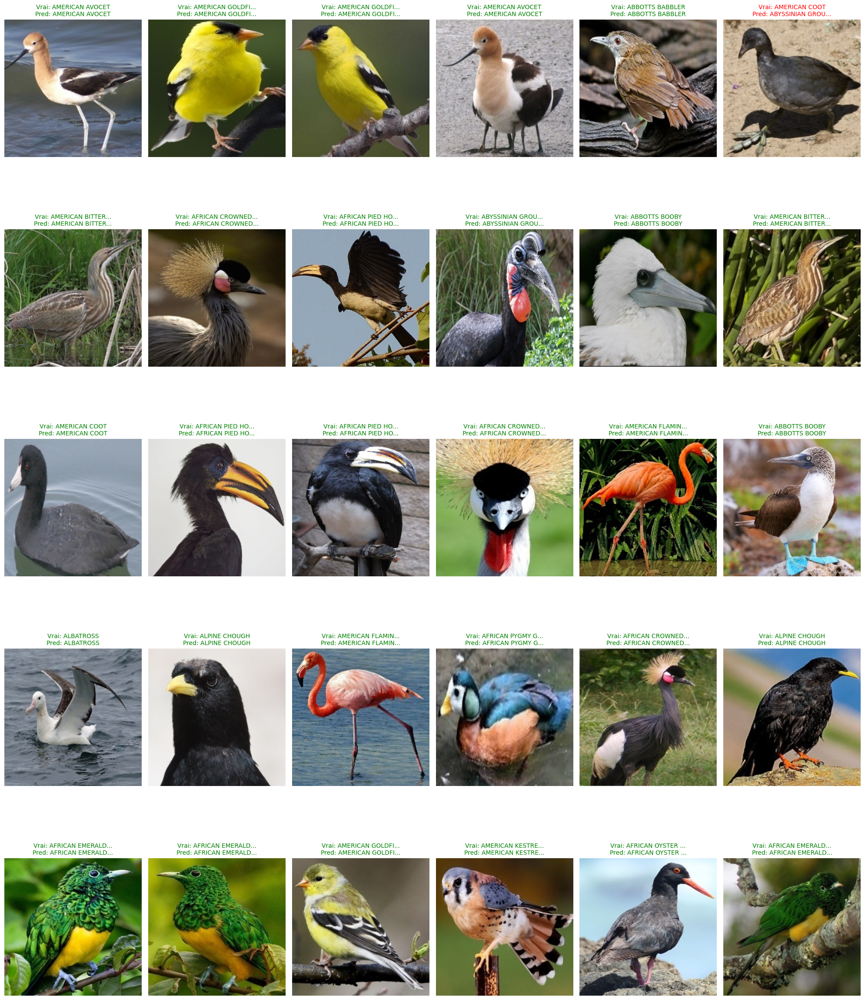


Résultats sur 30 images aléatoires:
Précision: 96.67% (29/30)
Total images test: 100
Classes disponibles: ABBOTTS BABBLER, ABBOTTS BOOBY, ABYSSINIAN GROUND HORNBILL, AFRICAN CROWNED CRANE, AFRICAN EMERALD CUCKOO... (total 20 classes)


In [156]:
# 1. Prédictions sur l'ensemble de test
test_images.reset()
steps = int(np.ceil(len(test_images.filenames)/BATCH_SIZE))
predictions = model_EN.predict(test_images, steps=steps)
predicted_classes = np.argmax(predictions, axis=1)

# 2. Obtenir les informations des classes
true_classes = test_images.classes
class_names = list(test_images.class_indices.keys())

# 3. Sélectionner 30 indices aléatoires
num_images = min(30, len(test_images.filenames))
random_indices = random.sample(range(len(test_images.filenames)), num_images)

# 4. Configuration de l'affichage
cols = 6  # 6 colonnes pour 30 images (5 lignes)
rows = int(np.ceil(num_images/cols))
plt.figure(figsize=(20, 5*rows))

# 5. Afficher les images avec les prédictions
for i, idx in enumerate(random_indices):
    plt.subplot(rows, cols, i+1)
    
    # Charger l'image
    img_path = os.path.join(test_images.directory, test_images.filenames[idx])
    img = image.load_img(img_path, target_size=TARGET_SIZE)
    img_array = image.img_to_array(img)/255.0
    
    # Afficher l'image
    plt.imshow(img_array)
    
    # Obtenir les classes
    true_class = class_names[true_classes[idx]]
    pred_class = class_names[predicted_classes[idx]]
    
    # Style du titre
    title_color = 'green' if true_class == pred_class else 'red'
    title_font = {'color': title_color, 'fontsize': 10}
    
    # Format court pour les noms de classes si trop longs
    true_short = true_class[:15] + '...' if len(true_class) > 15 else true_class
    pred_short = pred_class[:15] + '...' if len(pred_class) > 15 else pred_class
    
    plt.title(f"Vrai: {true_short}\nPred: {pred_short}", fontdict=title_font)
    plt.axis('off')

plt.tight_layout()
plt.show()

# 6. Statistiques
correct = sum(true_classes[random_indices] == predicted_classes[random_indices])
print(f"\nRésultats sur {num_images} images aléatoires:")
print(f"Précision: {correct/num_images:.2%} ({correct}/{num_images})")
print(f"Total images test: {len(test_images.filenames)}")
print(f"Classes disponibles: {', '.join(class_names[:5])}... (total {len(class_names)} classes)")

In [152]:
# 1. Prédictions sur l'ensemble de test complet
test_images.reset()
steps = int(np.ceil(len(test_images.filenames)/BATCH_SIZE))
predictions = model_EN.predict(test_images, steps=steps)
predicted_classes = np.argmax(predictions, axis=1)

# 2. Vraies classes et noms de classes
true_classes = test_images.classes
class_names = list(test_images.class_indices.keys())


# 4. DataFrame pour une meilleure visualisation
report_dict = classification_report(true_classes, predicted_classes,
                                  target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

# Afficher les métriques par classe avec style
styled_report = report_df.style\
    .background_gradient(cmap='viridis', subset=['precision', 'recall', 'f1-score'])\
    .format("{:.3f}", subset=['precision', 'recall', 'f1-score'])\
    .set_caption("Métriques par Classe")

display(styled_report)



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


,precision,recall,f1-score,support
ABBOTTS BABBLER,1.000,1.000,1.000,5.000000
ABBOTTS BOOBY,1.000,0.800,0.889,5.000000
ABYSSINIAN GROUND HORNBILL,0.833,1.000,0.909,5.000000
AFRICAN CROWNED CRANE,1.000,1.000,1.000,5.000000
AFRICAN EMERALD CUCKOO,1.000,1.000,1.000,5.000000
AFRICAN FIREFINCH,1.000,1.000,1.000,5.000000
AFRICAN OYSTER CATCHER,1.000,1.000,1.000,5.000000
AFRICAN PIED HORNBILL,1.000,1.000,1.000,5.000000
AFRICAN PYGMY GOOSE,1.000,1.000,1.000,5.000000
ALBATROSS,0.833,1.000,0.909,5.000000
